In [3]:
from IPython.display import display, HTML, Image
display(HTML("<style>.container { width:95% !important; }</style>"))

%load_ext autoreload
%autoreload 2

import os
import numpy as np
import scanpy as sc
import scanpy.external as sce

from matplotlib import cm
import matplotlib.pyplot as plt

import sys
sys.path.append("../../lib")
from stpalette import palette1
from plots import plotSpatialAll

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
model = 'WM4007'

In [30]:
preprocessedDataPath = 'c:/Projects/A_ST/from HPCC 11 28 2022/results_NF1-nod-t2t-k35/%s/' % model
dataPath = '../../data/'

ids = sorted(np.loadtxt(dataPath + 'ids_%s_ST.txt' % model, dtype=str))
ids

['WM4007_T0_S1_ST',
 'WM4007_T0_S2_ST',
 'WM4007_T1_S1_ST',
 'WM4007_T1_S2_ST',
 'WM4007_T2_S1_ST',
 'WM4007_T2_S2_ST',
 'WM4007_T3_S1_ST',
 'WM4007_T3_S2_ST',
 'WM4007_T4_S1_ST',
 'WM4007_T4_S2_ST',
 'WM4007_TC_S1_ST',
 'WM4007_TC_S2_ST']

# Load scaled data object

In [7]:
ad_all = sc.read(dataPath + 'ad_all_scaled_unfiltered_st_%s.h5ad' % model)

ad_all = ad_all[:, ~ad_all.var['is_human_gene'].values]
ad_all.shape

(18110, 16461)

# Harmonize using only mouse genes

In [10]:
sc.pp.highly_variable_genes(ad_all, flavor="seurat", batch_key='sample', n_top_genes=2500)

C:\Users\domans\Anaconda3\lib\site-packages\scanpy\preprocessing\_highly_variable_genes.py:510: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.highly_variable.iloc[:n_top_genes] = True


In [12]:
sc.pp.pca(ad_all, n_comps=100, zero_center=True, use_highly_variable=True)
sce.pp.harmony_integrate(ad_all, 'sample')
sc.pp.neighbors(ad_all, use_rep='X_pca_harmony')
sc.tl.umap(ad_all)

for res in [0.55, 0.65, 0.75, 0.85, 1.0]:
    sc.tl.leiden(ad_all, key_added='all_clusters_%s' % res, resolution=res)

2022-12-05 08:57:43,689 - harmonypy - INFO - Iteration 1 of 10
2022-12-05 08:57:52,094 - harmonypy - INFO - Iteration 2 of 10
2022-12-05 08:58:00,703 - harmonypy - INFO - Iteration 3 of 10
2022-12-05 08:58:09,417 - harmonypy - INFO - Iteration 4 of 10
2022-12-05 08:58:18,021 - harmonypy - INFO - Converged after 4 iterations


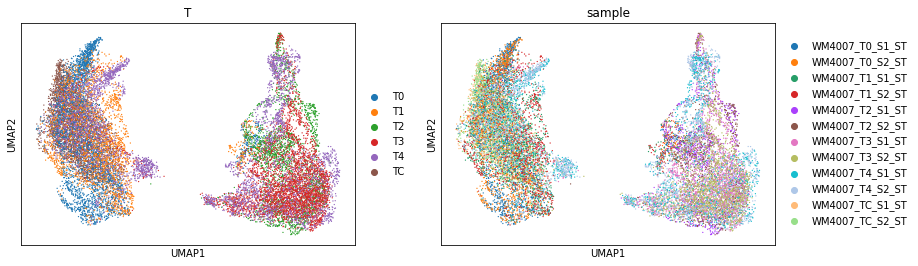

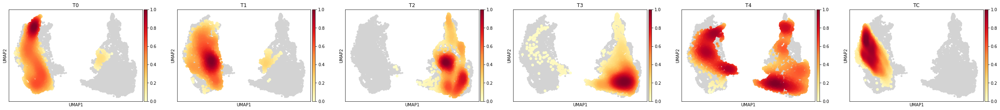

In [13]:
sc.pl.umap(ad_all, color=['T', 'sample'])

identity = 'T'
sc.tl.embedding_density(ad_all, basis='umap', groupby=identity)
sc.pl.embedding_density(ad_all, groupby=identity, ncols=10)

Trying to set attribute `.obs` of view, copying.


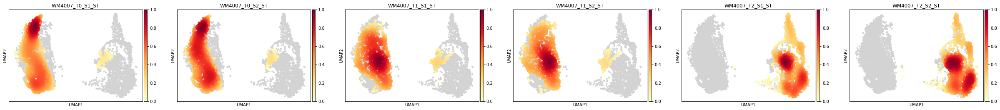

Trying to set attribute `.obs` of view, copying.


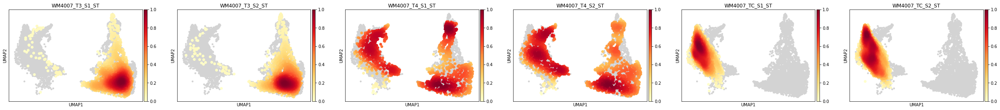

In [15]:
identity = 'sample'
ids = list(ad_all.obs[identity].unique().sort_values())
try:
    ad_p1 = ad_all[ad_all.obs[identity].isin(ids[:6]), :]
    sc.tl.embedding_density(ad_p1, basis='umap', groupby=identity)
    sc.pl.embedding_density(ad_p1, groupby=identity, ncols=6)
    
    ad_p2 = ad_all[ad_all.obs[identity].isin(ids[6:]), :]
    sc.tl.embedding_density(ad_p2, basis='umap', groupby=identity)
    sc.pl.embedding_density(ad_p2, groupby=identity, ncols=6)
except:
    pass

# Select clustering resolution

In [36]:
res = 0.75

In [37]:
if False:
    identity = 'all_clusters_%s' % res
    sc.tl.embedding_density(ad_all, basis='umap', groupby=identity)
    sc.pl.embedding_density(ad_all, groupby=identity, ncols=10)

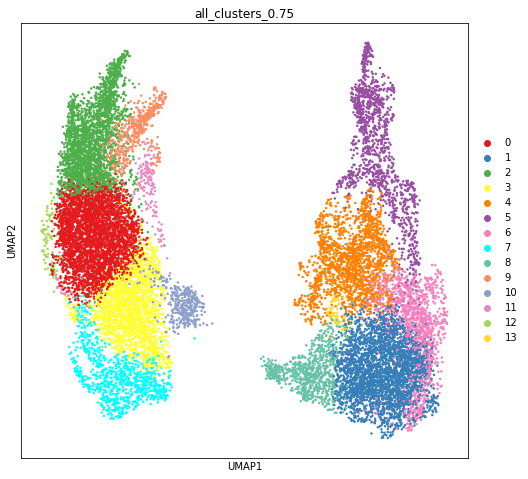

In [38]:
plt.rcParams["figure.figsize"] = (8,8)
identity = 'all_clusters_%s' % res
sc.pl.umap(ad_all, color=[identity], palette=palette1, size=25, add_outline=False)
plt.rcParams["figure.figsize"] = (5,5)

# Inspect mouse markers

In [26]:
# sc.pl.umap(ad_all, color=['Col1a1', 'Ost4', 'Actb'])

In [27]:
# sc.pl.violin(ad_all, keys=['Apoe', 'Ctsd', 'Ftl1', 'Ctsb', 'Fth1', 'Tmsb4x', 'Cst3', 'B2m', 'Lyz2', 'Rplp1', 'Psap', 'Col1a2', 'Actb', 'Fau', 'H2-K1', 'Eef1a1', 'C1qa', 'Col3a1', 'Ifi27l2a', 'Rpl41', 'Sparc', 'H2-D1', 'mt-Co3', 'mt-Co1', 'Rps24', 'Col1a1', 'Rps29', 'Rps12', 'Tpt1', 'Gm42418'], groupby='T')

In [28]:
# sc.pl.violin(ad_all, keys=['Col1a1', 'Ost4', 'Actb'], groupby='all_clusters_0.75')

# Plot spatial layout

In [31]:
images = {id: sc.read(preprocessedDataPath + '%s/st_adata_processed.h5ad' % id).uns['spatial'] for id in ids}

ads = dict()
for sample in ids[:]:
    ads[sample] = ad_all[ad_all.obs['sample']==sample, :].copy()    
    ads[sample].uns['spatial'] = images[sample]

### Total mouse counts per spot

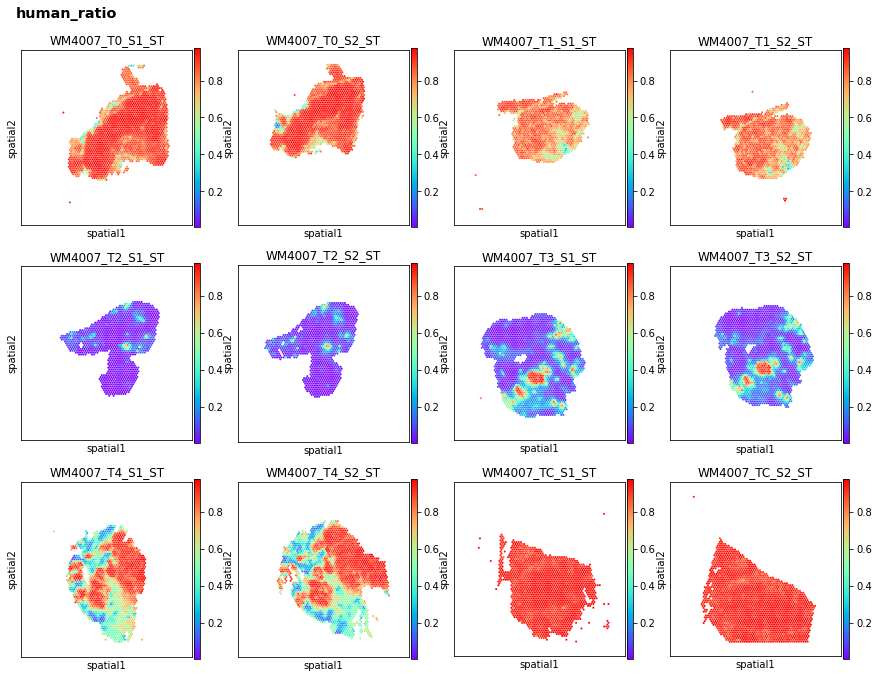

In [32]:
plotSpatialAll(ads, identity = 'human_ratio', img_key=None)

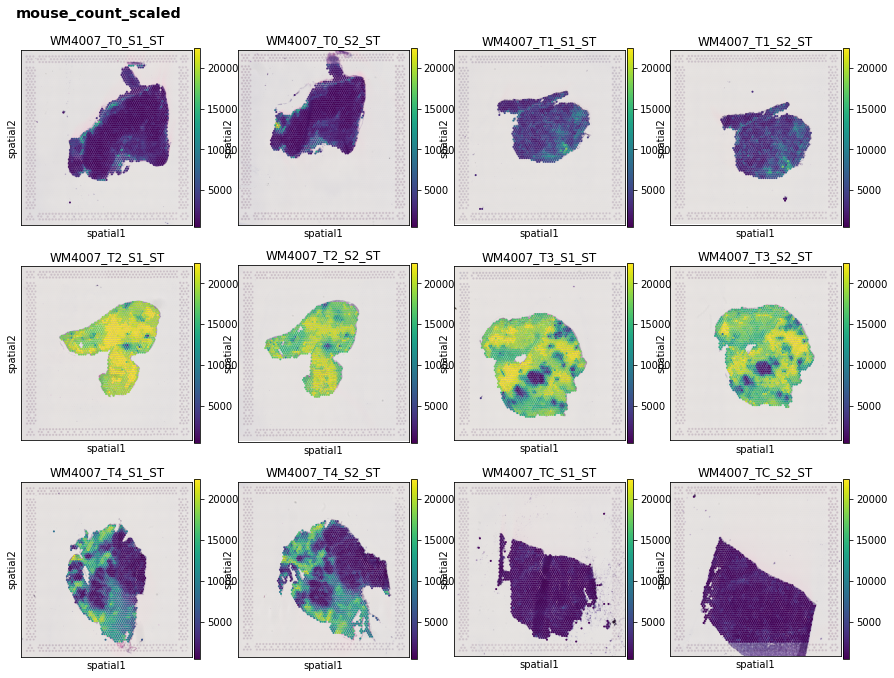

In [33]:
plotSpatialAll(ads, identity = 'mouse_count_scaled', cmap=None)

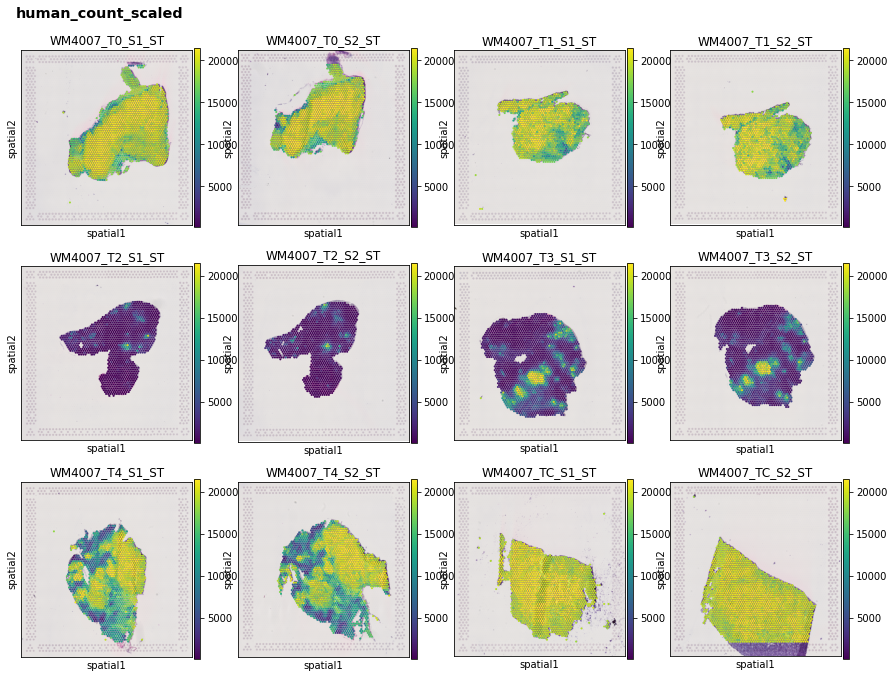

In [34]:
plotSpatialAll(ads, identity = 'human_count_scaled', cmap=None)

### Clusters based on mouse genes

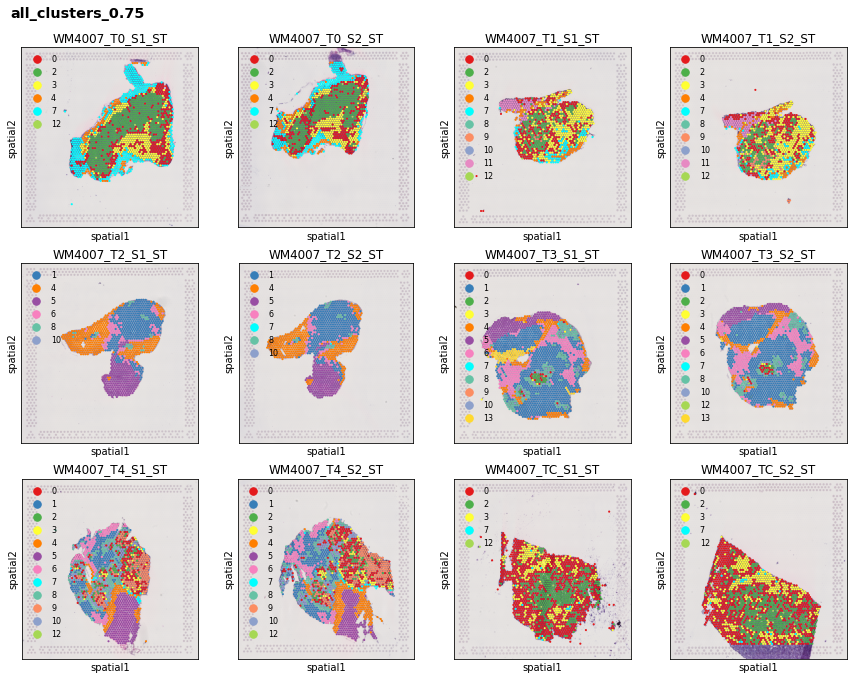

In [39]:
plotSpatialAll(ads, identity = 'all_clusters_%s' % res, palette=palette1, f=0.75)

### H&E images

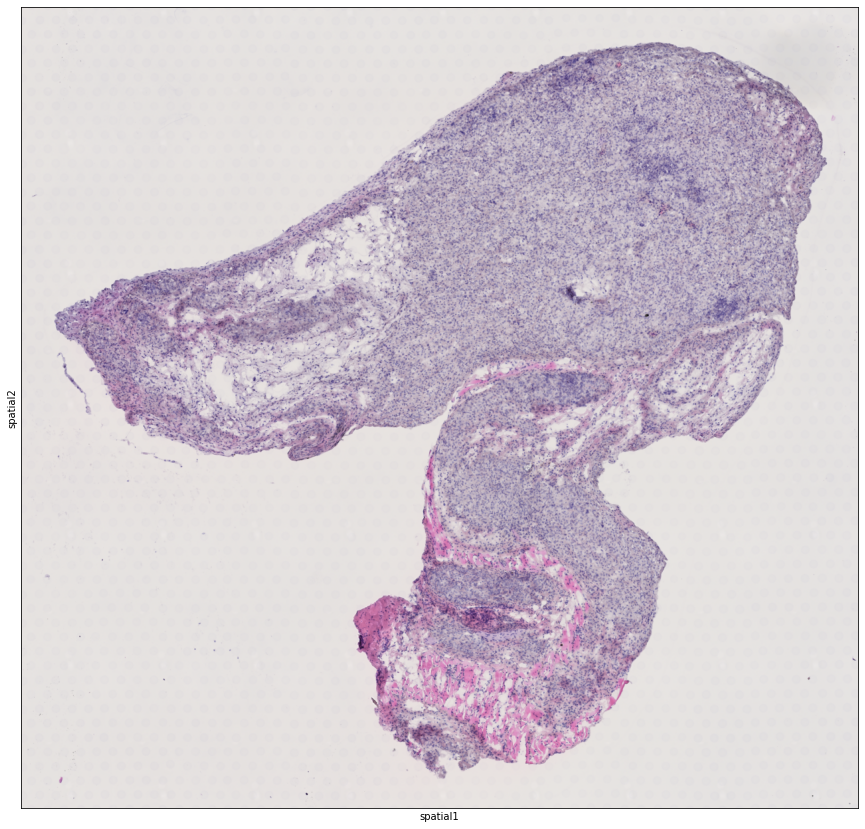

In [40]:
plt.rcParams["figure.figsize"] = (15,15)
sc.pl.spatial(ads['WM4007_T2_S1_ST'], img_key="hires", color=None)

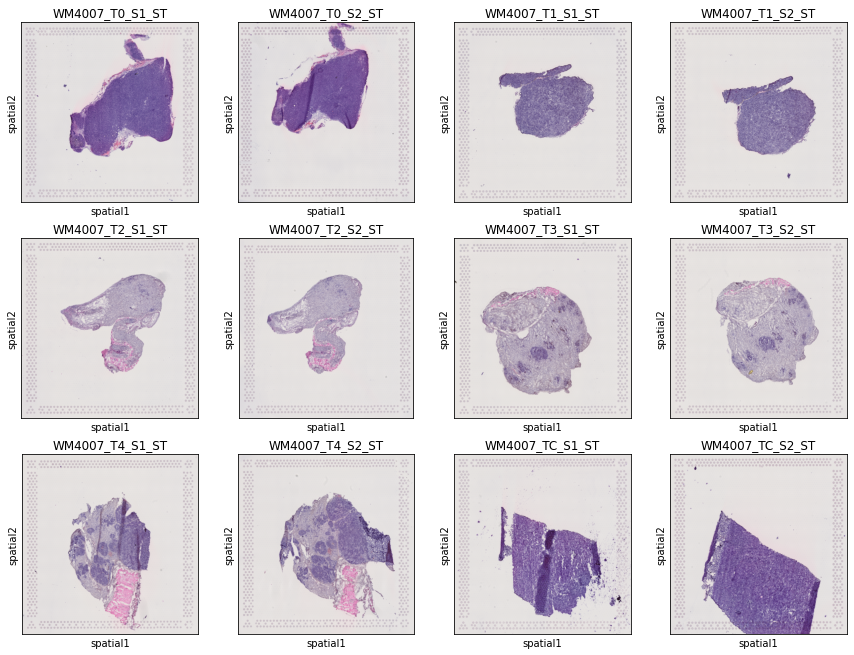

In [41]:
plotSpatialAll(ads, identity=None, f=0.75)

### Separate clusters to inspect

WM4007_T0_S1_ST


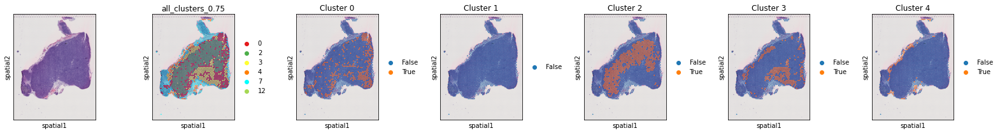

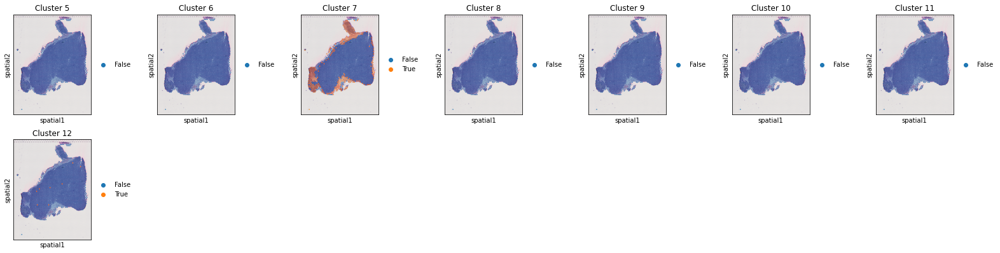

WM4007_T0_S2_ST


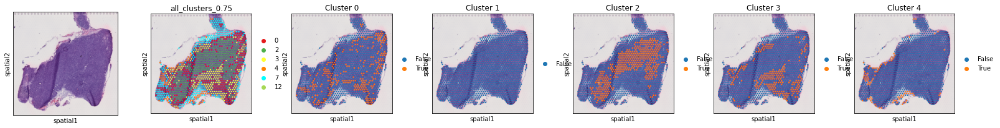

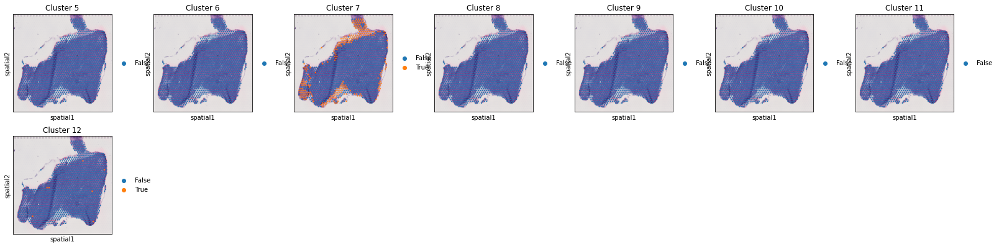

WM4007_T1_S1_ST


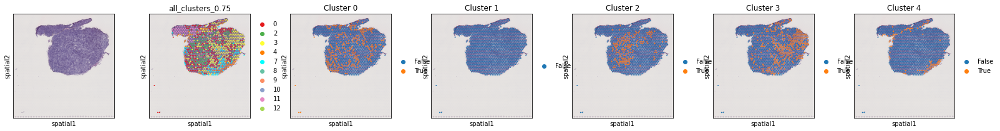

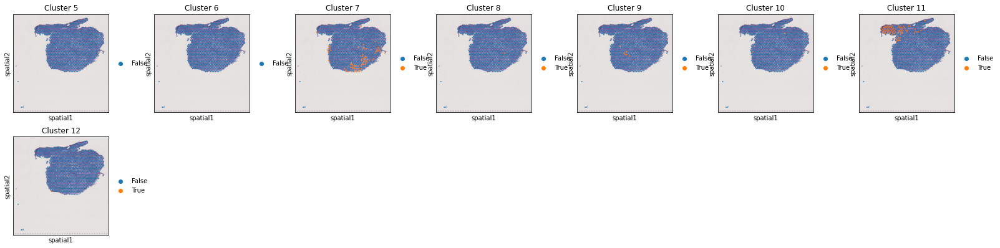

WM4007_T1_S2_ST


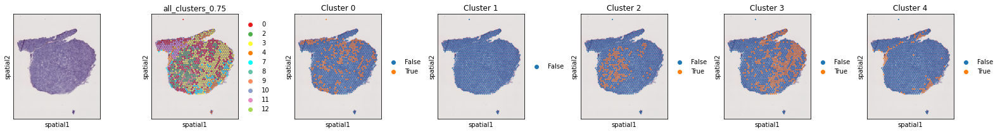

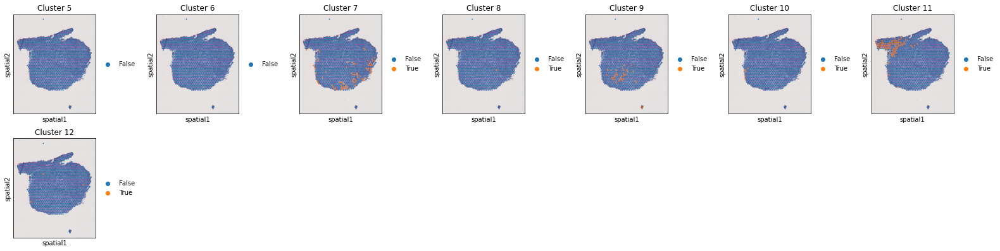

WM4007_T2_S1_ST


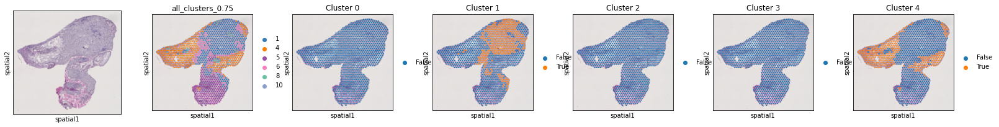

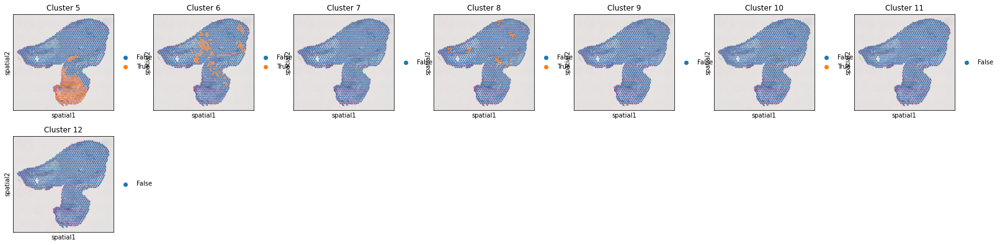

WM4007_T2_S2_ST


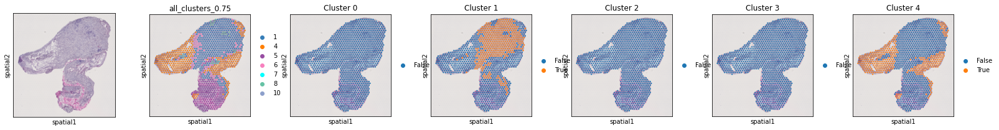

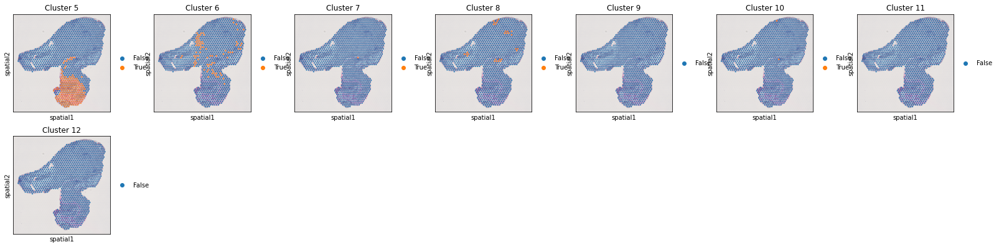

WM4007_T3_S1_ST


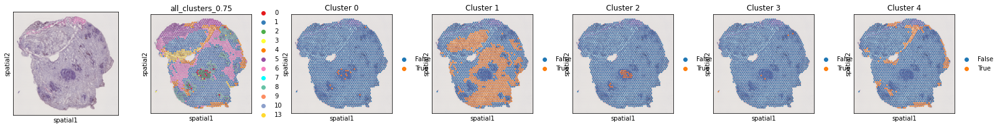

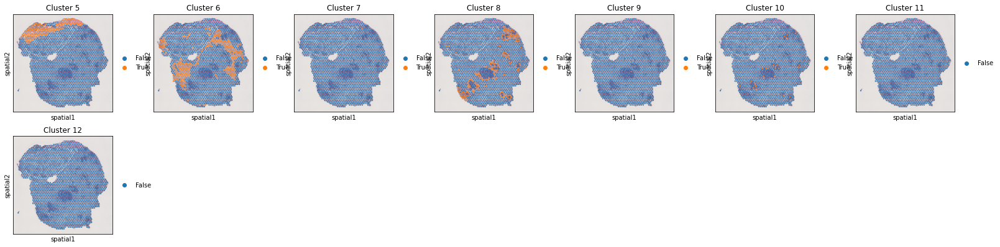

WM4007_T3_S2_ST


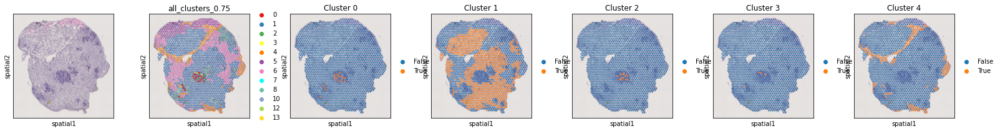

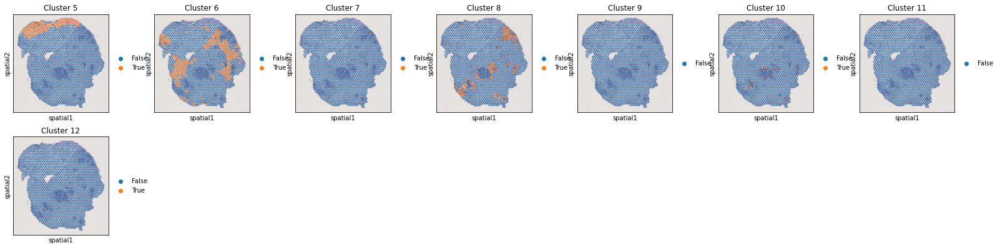

WM4007_T4_S1_ST


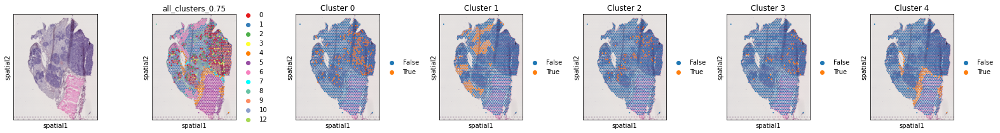

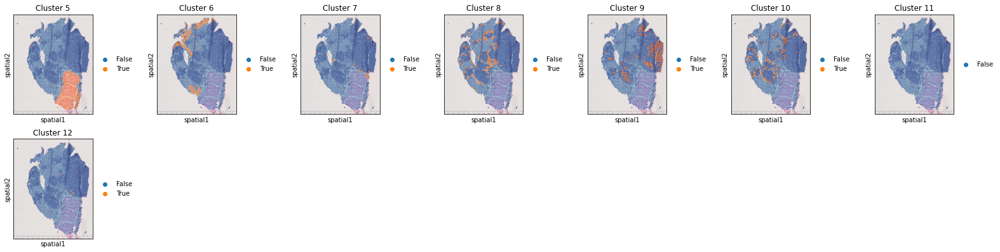

WM4007_T4_S2_ST


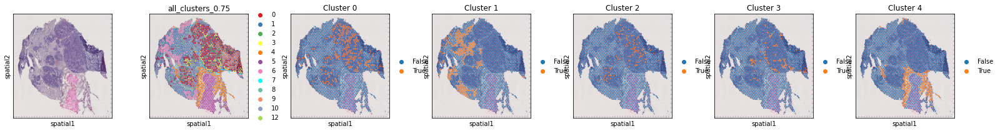

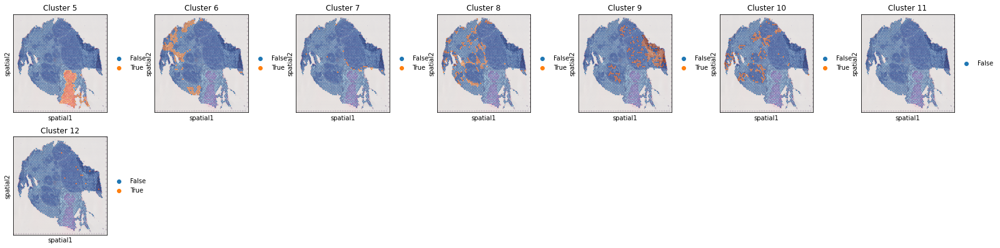

WM4007_TC_S1_ST


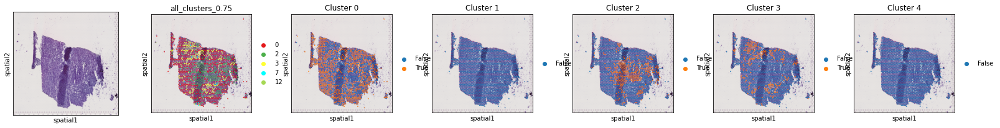

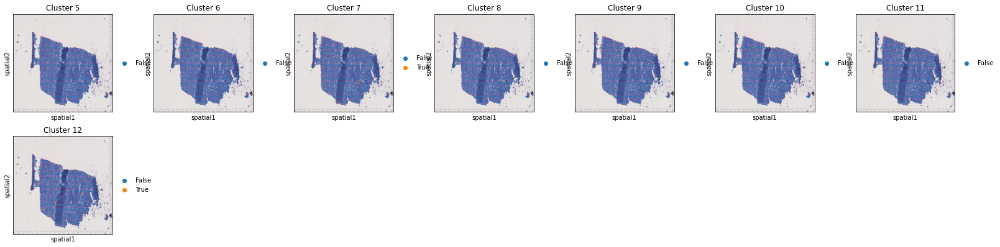

WM4007_TC_S2_ST


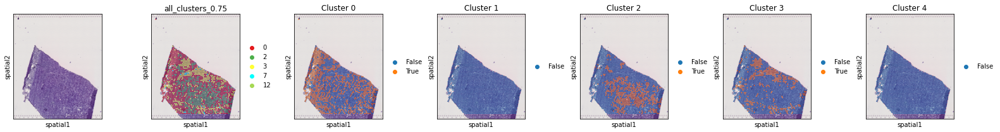

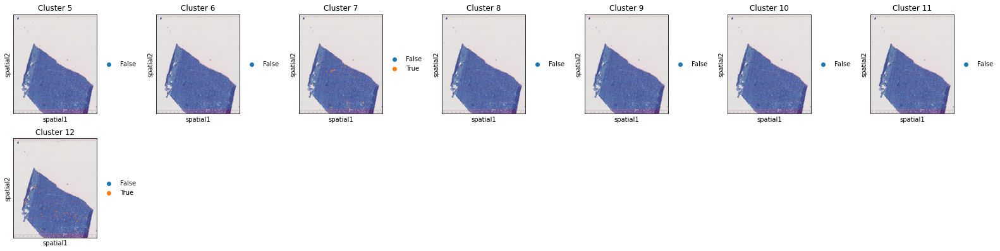

In [42]:
plt.rcParams["figure.figsize"] = (3,3)

for sample in ids[:]:
    print(sample)
    plotHE = True
    for g in list(range(0, 5)), list(range(5, 13)):
        for i in g:
            ads[sample].obs['Cluster %s' % i] = (ads[sample].obs['all_clusters_%s' % (res)]==str(i)).astype('category')
        init = [None, 'all_clusters_%s' % (res)] if plotHE else []
        plotHE = False
        sc.pl.spatial(ads[sample], img_key="lowres", color=init + ['Cluster %s' % i for i in g], ncols=7)

### Export identifiers of the ramaining spots

In [43]:
df_index_filtered_with_mouse_genes = ad_all[~ad_all.obs['all_clusters_%s' % (res)].isin(['1', '4', '5']), :].obs[['original_barcode', 'sample']]
df_index_filtered_with_mouse_genes.to_csv(dataPath + 'df_index_filtered_with_mouse_genes_%s.csv' % model)
df_index_filtered_with_mouse_genes

,original_barcode,sample
AAACAAGTATCTCCCA-1-WM4007_TC_S1_ST,AAACAAGTATCTCCCA-1,WM4007_TC_S1_ST
AAACATTTCCCGGATT-1-WM4007_TC_S1_ST,AAACATTTCCCGGATT-1,WM4007_TC_S1_ST
AAACCGGGTAGGTACC-1-WM4007_TC_S1_ST,AAACCGGGTAGGTACC-1,WM4007_TC_S1_ST
AAACCGTTCGTCCAGG-1-WM4007_TC_S1_ST,AAACCGTTCGTCCAGG-1,WM4007_TC_S1_ST
AAACCTAAGCAGCCGG-1-WM4007_TC_S1_ST,AAACCTAAGCAGCCGG-1,WM4007_TC_S1_ST
...,...,...
TTGTGTTTCCCGAAAG-1-WM4007_T4_S2_ST,TTGTGTTTCCCGAAAG-1,WM4007_T4_S2_ST
TTGTTAGCAAATTCGA-1-WM4007_T4_S2_ST,TTGTTAGCAAATTCGA-1,WM4007_T4_S2_ST
TTGTTCAGTGTGCTAC-1-WM4007_T4_S2_ST,TTGTTCAGTGTGCTAC-1,WM4007_T4_S2_ST
TTGTTGTGTGTCAAGA-1-WM4007_T4_S2_ST,TTGTTGTGTGTCAAGA-1,WM4007_T4_S2_ST


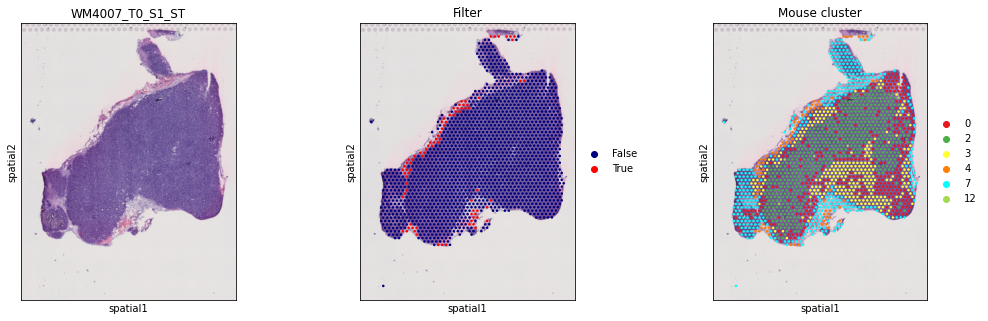

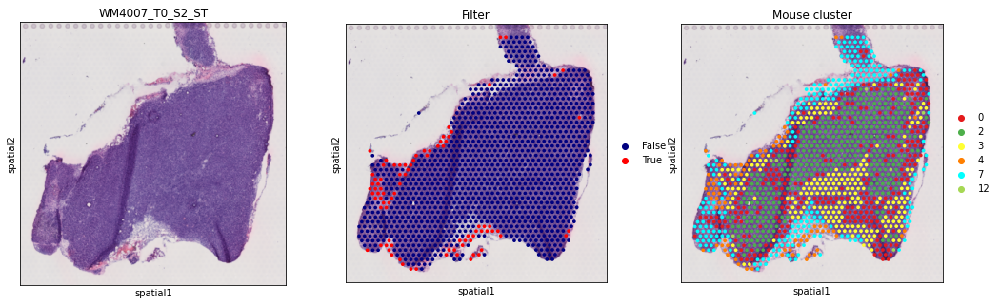

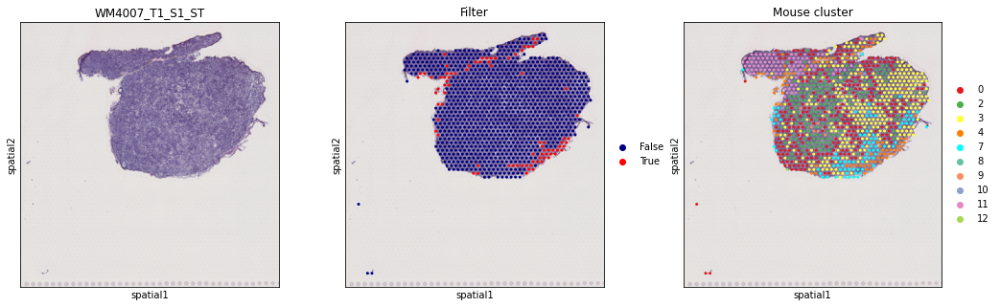

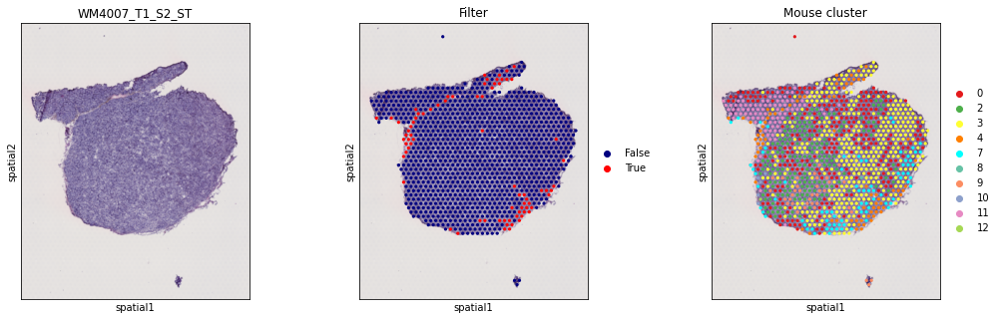

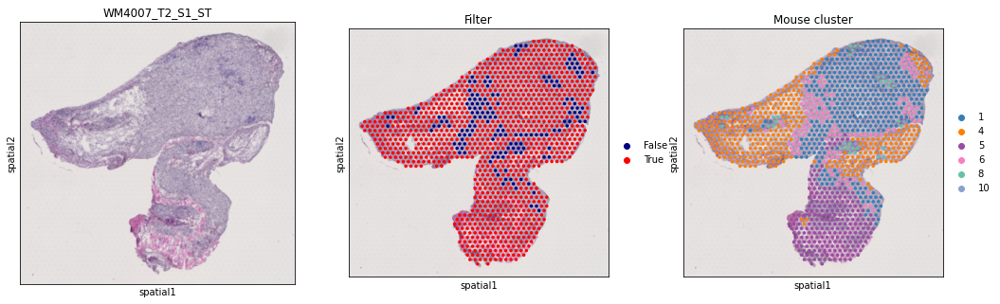

...

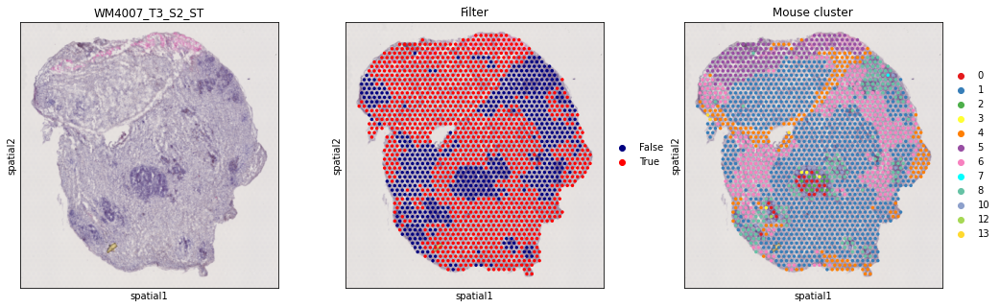

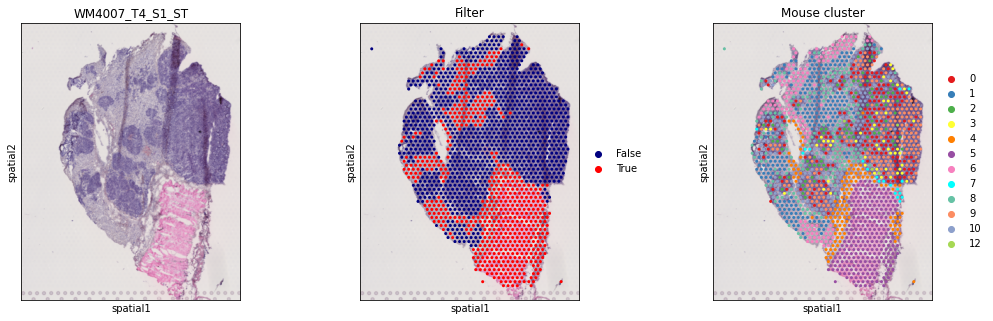

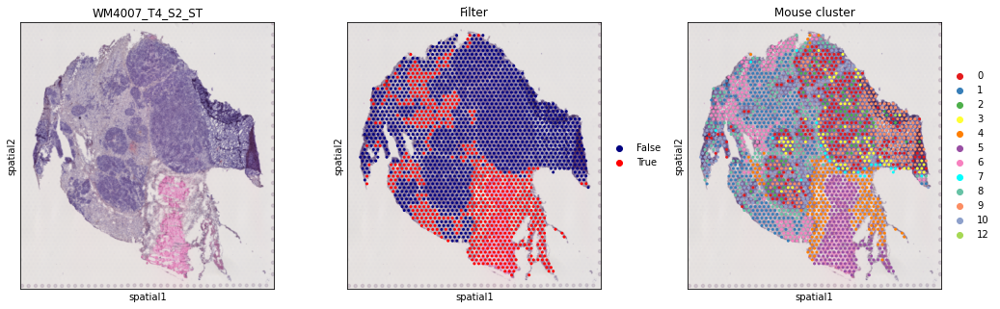

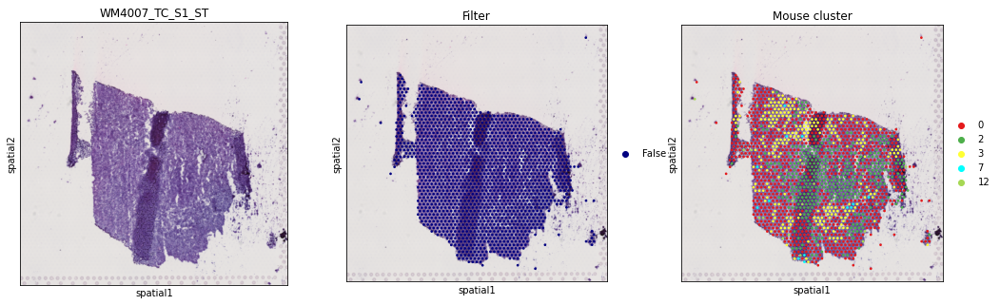

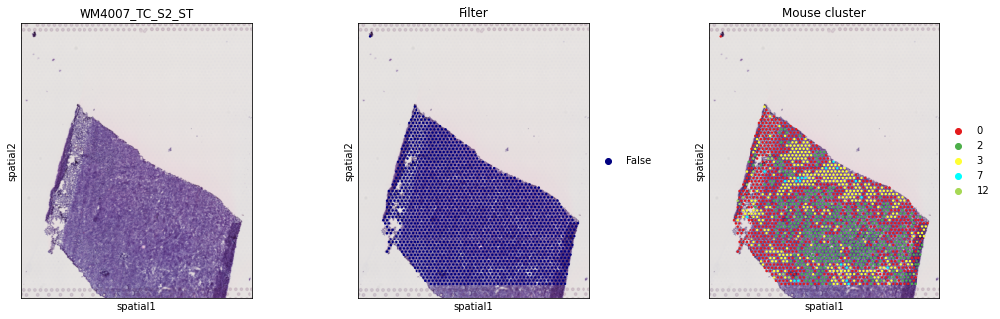

In [47]:
palette1.update({'True': 'red', 'False': 'navy'})

plt.rcParams["figure.figsize"] = (5,5)
    
for sample in ids:
    ads[sample].obs['is_stroma'] = pd.Series(~ads[sample].obs.index.isin(df_index_filtered_with_mouse_genes.index)).astype(str).astype('category').values
    sc.pl.spatial(ads[sample], img_key="lowres", color=[None, 'is_stroma', 'all_clusters_%s' % res], palette=palette1, title=[sample, 'Filter', 'Mouse cluster'])    